# EDA notebook

***In this notebook we perform initial Exploratory Data Analysis***

Note: Initially EDA has been performed using Kaggle(we highly advice running this notebook in Kaggle), so some adjustments to configuration and code may be required for local usage.

## EDA

Imports

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.cm as cm
import scipy.stats as stats
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import matplotlib.colors as mcolors

Adjust default restrictions

In [2]:
# Set the maximum number of columns to be displayed
pd.set_option('display.max_columns', None)

# Optionally, to control the width of the columns and avoid truncation:
pd.set_option('display.width', None)

Definde GLOBAL variables

In [3]:
DATA_DIR = "/kaggle/input/quantumassessmentdataset/"

NUMBER_OF_FEATURES = 53
COMMON_COLUMNS = [str(i) for i in range(NUMBER_OF_FEATURES)]
TARGET_COLUMN = "target"

CATEGORICAL_IDENTIFIER_THRESHOLD = 100

# Get all named CSS4 colors
ALL_MATPLOTLIB_COLORS_LIST = list(mcolors.CSS4_COLORS.values())

cmap = plt.colormaps.get_cmap('viridis')
norm = mcolors.Normalize(vmin=0, vmax=1)

# Generate a list of 10 colors
MAIN_VIRIDIS_COLORS_LEN = 10
MAIN_VIRIDIS_COLORS_LIST = [cmap(norm(i / MAIN_VIRIDIS_COLORS_LEN)) for i in range(MAIN_VIRIDIS_COLORS_LEN)]

# MAIN_VIRIDIS_COLORS_LEN = len(MAIN_VIRIDIS_COLORS_LIST)

In [4]:
train_df = pd.read_csv(f"{DATA_DIR}train.csv")
hidden_test_df = pd.read_csv(f"{DATA_DIR}hidden_test.csv")

In [5]:
train_df.shape, hidden_test_df.shape, 

((90000, 54), (10000, 53))

In [6]:
train_df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,target
count,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000
mean,249.423944,250.236267,248.637289,249.736600,249.436178,249.656167,-0.011402,0.498548,0.499189,249.842033,249.818967,249.346778,249.899900,7.483940,7.498037,7.496259,7.501635,7.486463,7.523043,7.475585,7.494835,7.503939,7.507724,7.508681,7.472421,7.519205,7.515753,7.509402,7.496781,7.504014,7.494212,7.490808,7.486936,7.514508,7.491614,7.520193,7.507801,7.493713,7.513840,7.507033,7.479579,7.519826,7.502483,7.512965,7.475155,7.523962,7.508397,7.473322,7.490658,7.474578,7.509206,7.487159,7.513316,50.033981
std,144.336393,144.022200,144.107577,144.284945,143.941581,144.329168,7.038171,0.288682,0.500002,144.612718,144.363827,144.476128,144.310495,4.330908,4.318388,4.338732,4.345618,4.318031,4.323500,4.327327,4.325447,4.330159,4.332599,4.328966,4.345228,4.339104,4.333907,4.331007,4.334982,4.318553,4.327286,4.322672,4.329524,4.329973,4.333144,4.335244,4.329515,4.327480,4.333543,4.327670,4.326175,4.315565,4.333881,4.329929,4.330410,4.321537,4.331761,4.335692,4.332122,4.323035,4.326364,4.324876,4.333080,28.897243
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.949874,0.000014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000095,0.000252,0.000190,0.000192,0.000067,0.000229,0.000125,0.000382,0.000398,0.000140,0.000382,0.000129,0.000192,0.000017,0.000080,0.000161,0.000437,0.000041,0.000070,0.000074,0.000111,0.000067,0.000078,0.000018,0.000094,0.000020,0.000106,0.000105,0.000273,0.000315,0.000060,0.000019,0.000040,0.000154,0.000083,0.000367,0.000014,0.000160,0.000147,0.000125,0.002634
25%,125.000000,126.000000,124.000000,125.000000,125.000000,124.000000,-7.071068,0.248932,0.000000,124.000000,126.000000,124.000000,125.000000,3.723392,3.763626,3.718755,3.719537,3.758746,3.778857,3.733780,3.748951,3.760261,3.742810,3.768145,3.685140,3.760790,3.746467,3.772795,3.741697,3.774239,3.743116,3.763061,3.750034,3.778028,3.743842,3.752848,3.776405,3.755325,3.754465,3.771945,3.731527,3.784809,3.763004,3.768044,3.707544,3.797002,3.760627,3.715721,3.739358,3.715298,3.773381,3.743536,3.776322,25.091903
50%,250.000000,251.000000,248.000000,250.000000,250.000000,250.000000,0.000000,0.497136,0.000000,250.000000,250.000000,249.000000,251.000000,7.483265,7.505267,7.502682,7.515240,7.467721,7.539462,7.460267,7.481500,7.521563,7.520793,7.520739,7.484349,7.526894,7.528984,7.494876,7.491009,7.500083,7.514475,7.483334,7.458614,7.513794,7.475324,7.550623,7.484699,7.472789,7.518614,7.504101,7.452493,7.532363,7.511806,7.507058,7.474127,7.533987,7.505259,7.459774,7.494167,7.477270,7.512575,7.476564,7.506812,50.030705
75%,374.000000,375.000000,374.000000,375.000000,373.000000,374.000000,7.000000,0.747513,1.000000,376.000000,375.000000,375.000000,375.000000,11.242883,11.228331,11.258049,11.284618,11.238904,11.254751,11.211187,11.238128,11.248749,11.244657,11.240915,11.239795,11.276738,11.272683,11.271486,11.257988,11.233189,11.223296,11.229486,11.245719,11.272623,11.241922,11.261178,11.255442,11.251097,11.270277,11.241504,11.222543,11.241135,11.255483,11.272459,11.216585,11.276349,11.261971,11.215637,11.239232,11.210070,11.268156,11.234414,11.277835,75.059454
max,499.000000,499.000000,499.000000,499.00000

In [7]:
hidden_test_df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,248.387400,250.191800,248.064900,249.992200,251.642200,249.678600,-0.079268,0.505215,0.492200,245.823600,249.164800,250.119100,250.483700,7.510013,7.422919,7.524276,7.480496,7.542805,7.486749,7.543878,7.470930,7.487228,7.463924,7.480095,7.463081,7.501495,7.563922,7.529382,7.573613,7.504179,7.516057,7.521130,7.454040,7.583621,7.488388,7.447334,7.541466,7.456547,7.354651,7.449582,7.446619,7.519481,7.510101,7.422179,7.488576,7.526853,7.449717,7.438931,7.563141,7.510016,7.465383,7.503378,7.503662
std,144.124521,144.850399,144.792255,144.015371,144.745324,144.677689,7.032273,0.285678,0.499964,142.852057,144.878226,145.632335,144.900116,4.337977,4.314456,4.359013,4.313662,4.360080,4.343422,4.326001,4.351735,4.342221,4.350220,4.316420,4.333474,4.283716,4.337939,4.325639,4.324341,4.318745,4.327828,4.329726,4.325633,4.340549,4.335361,4.335703,4.339896,4.327846,4.315967,4.355657,4.345184,4.324215,4.327507,4.335234,4.321760,4.340501,4.328863,4.308985,4.347630,4.353635,4.363206,4.338020,4.291431
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.949874,0.000260,0.000000,0.000000,0.000000,0.000000,0.000000,0.000534,0.000735,0.001009,0.002425,0.001938,0.001878,0.000098,0.000112,0.000134,0.000407,0.003713,0.002003,0.000726,0.001153,0.000978,0.000612,0.004882,0.000117,0.005182,0.000698,0.000538,0.000012,0.000360,0.001679,0.000674,0.000438,0.002563,0.001193,0.002578,0.001920,0.000310,0.001103,0.000545,0.001244,0.000026,0.001580,0.000286,0.001716,0.000834,0.000132
25%,123.000000,123.000000,123.000000,128.000000,125.000000,124.000000,-7.071068,0.261199,0.000000,122.000000,123.000000,124.000000,125.000000,3.726694,3.699220,3.705847,3.746302,3.714119,3.705049,3.839919,3.624898,3.709006,3.698120,3.789745,3.711264,3.788748,3.824283,3.832993,3.838422,3.829372,3.777752,3.744229,3.714690,3.787502,3.704058,3.685488,3.793690,3.694083,3.575156,3.658494,3.639790,3.805628,3.810208,3.707353,3.758763,3.762664,3.711092,3.753059,3.805891,3.734299,3.696070,3.758126,3.810301
50%,249.000000,251.000000,246.000000,252.000000,252.000000,249.000000,-1.000000,0.507519,0.000000,244.000000,249.000000,252.000000,251.000000,7.562736,7.395801,7.512628,7.505363,7.552075,7.480087,7.613453,7.477880,7.476664,7.396711,7.443644,7.494765,7.464284,7.590579,7.496124,7.627596,7.525663,7.523263,7.598453,7.436733,7.624858,7.478955,7.340204,7.506271,7.478763,7.302234,7.476156,7.383178,7.528164,7.507894,7.371637,7.531310,7.550432,7.361451,7.377399,7.627437,7.547184,7.441250,7.500340,7.429109
75%,373.000000,377.000000,375.000000,373.000000,379.000000,374.000000,7.071068,0.750603,1.000000,368.000000,374.000000,378.000000,376.000000,11.269315,11.149947,11.332802,11.194596,11.322267,11.265878,11.224627,11.254231,11.282292,11.277635,11.268109,11.207078,11.197466,11.340517,11.301186,11.279402,11.213183,11.273499,11.253210,11.151100,11.321960,11.246703,11.278194,11.364622,11.214660,11.071916,11.245962,11.229083,11.235955,11.271190,11.147130,11.193657,11.311366,11.201442,11.154313,11.338666,11.276399,11.297861,11.268075,11.209570
max,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,9.949874,0.999982,1.000000,499.000000,499.000000,499.0

In [8]:
dtypes_table = pd.DataFrame({
    'Column': train_df.columns,
    'train_df dtype': train_df.dtypes,
    'hidden_test_df dtype': hidden_test_df.dtypes
})

dtypes_table

,Column,train_df dtype,hidden_test_df dtype
0,0,int64,int64
1,1,int64,int64
10,2,int64,int64
11,3,int64,int64
12,4,int64,int64
13,5,float64,float64
14,6,float64,float64
15,7,float64,float64
16,8,float64,float64
17,9,float64,float64


In [9]:
train_duplicate_rows_df = train_df[train_df.duplicated()]
print("number of duplicate rows in train: ", train_duplicate_rows_df.shape)

hidden_test_duplicate_rows_df = hidden_test_df[hidden_test_df.duplicated()]
print("number of duplicate rows in test: ", hidden_test_duplicate_rows_df.shape)

number of duplicate rows in train:  (0, 54)
number of duplicate rows in test:  (0, 53)


Identify categorical columns

In [10]:
def find_categorical_columns(df, threshold=10):
    """
    Identifies categorical columns in a DataFrame based on data type and 
    a threshold for the number of unique values.
    
    Parameters:
    - df (pd.DataFrame): The DataFrame to analyze.
    - threshold (int): The maximum number of unique values a column can have to be considered categorical.
    
    Returns:
    - list: A list of categorical column names.
    """
    # Identify columns with data types typically used for categories
    categorical_columns = df.select_dtypes(include=['object', 'category']).columns
    
    # Include numeric or other columns with unique values below the threshold
    categorical_columns = categorical_columns.union(
        df.columns[df.nunique() <= threshold]
    )
    
    # Convert to a list for easier handling
    categorical_columns = list(categorical_columns)
    
    # Print results for each column
    print("Categorical Columns:")
    print(categorical_columns)
    for col in categorical_columns:
        print(f"\nColumn: {col}")
        print(f"Unique Values: {df[col].unique()}")
    
    return categorical_columns

In [11]:
train_categories = find_categorical_columns(train_df, threshold=CATEGORICAL_IDENTIFIER_THRESHOLD)

Categorical Columns:
['8']

Column: 8
Unique Values: [0 1]


In [12]:
hiddent_test_df_categories = find_categorical_columns(hidden_test_df, threshold=CATEGORICAL_IDENTIFIER_THRESHOLD)

Categorical Columns:
['8']

Column: 8
Unique Values: [1 0]


In [13]:
def find_unseen_categories(train_df, test_df, threshold=1000):
    """
    Identifies categories in the test DataFrame that are not present in the train DataFrame for categorical columns.

    Parameters:
    - train_df (pd.DataFrame): The training DataFrame.
    - test_df (pd.DataFrame): The testing DataFrame.
    - threshold (int): Maximum number of unique values for a column to be considered categorical.

    Returns:
    - dict: A dictionary where keys are column names, and values are the unseen categories.
    """
    # Identify categorical columns for both DataFrames
    train_categories = find_categorical_columns(train_df, threshold)
    test_categories = find_categorical_columns(test_df, threshold)
    
    # Columns that are categorical in both DataFrames
    common_categorical_columns = set(train_categories).intersection(test_categories)
    
    unseen_categories = {}
    
    # Check for unseen values in each common categorical column
    for col in common_categorical_columns:
        unseen_values = set(test_df[col].unique()) - set(train_df[col].unique())
        if unseen_values:
            unseen_categories[col] = unseen_values
    
    return unseen_categories


In [14]:
unseen_categories = find_unseen_categories(train_df, hidden_test_df, threshold=100)

# Output unseen categories
if unseen_categories:
    print("Columns with unseen categories in the test set:")
    for col, values in unseen_categories.items():
        print(f"{col}: {values}")
else:
    print("No unseen categories found.")

Categorical Columns:
['8']

Column: 8
Unique Values: [0 1]
Categorical Columns:
['8']

Column: 8
Unique Values: [1 0]
No unseen categories found.


In [15]:
def plot_histogram(series, color='blue', title='Histogram', xlabel='Values', ylabel='Frequency'):
    """
    Plots a histogram for the given pandas Series.

    Parameters:
    series (pandas.Series): The input data series.
    bins (int): Number of bins for the histogram (default is 10).
    title (str): Title of the plot.
    xlabel (str): Label for the x-axis.
    ylabel (str): Label for the y-axis.

    Returns:
    None
    """
    plt.hist(series, bins=len(series.unique()), color=color)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

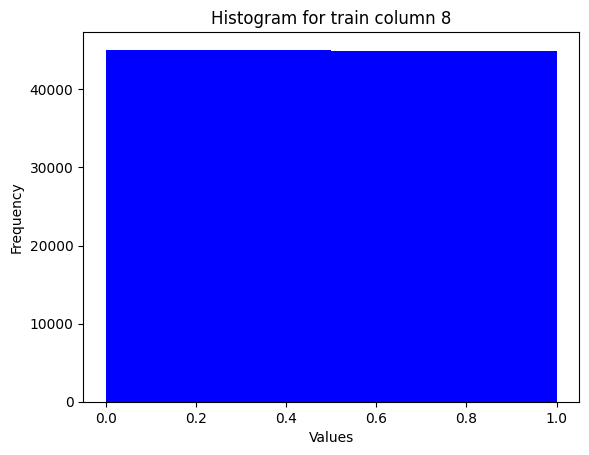

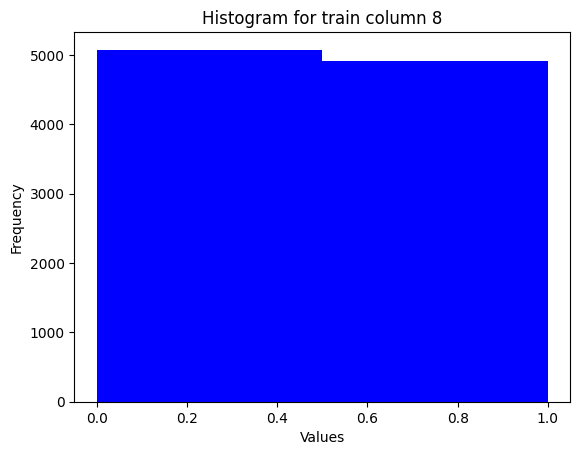

In [18]:
plot_histogram(train_df['8'], title="Histogram for train column 8") 
plot_histogram(hidden_test_df['8'], title="Histogram for train column 8")

Moving on to another column named 0; Current loop index: 0
0 is of type integer


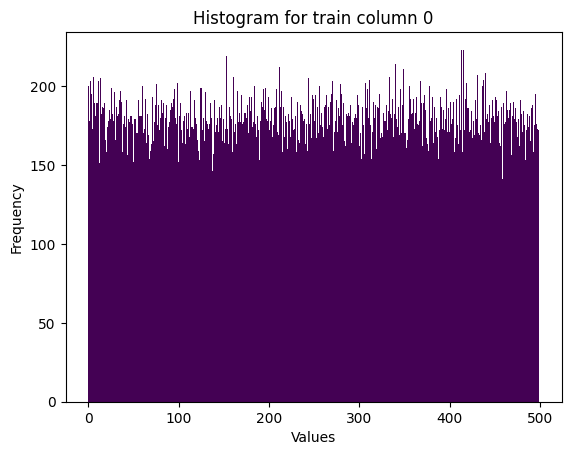

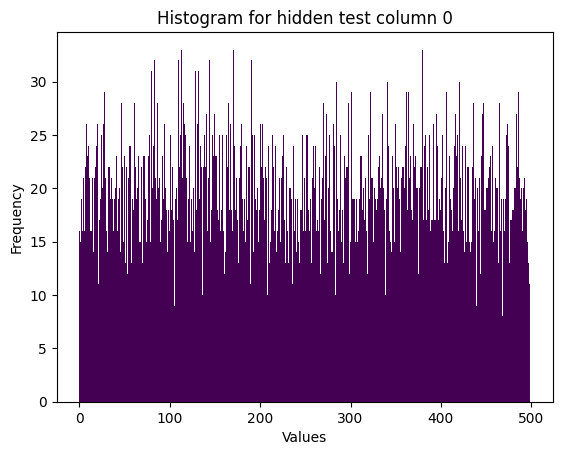

Moving on to another column named 1; Current loop index: 1
1 is of type integer


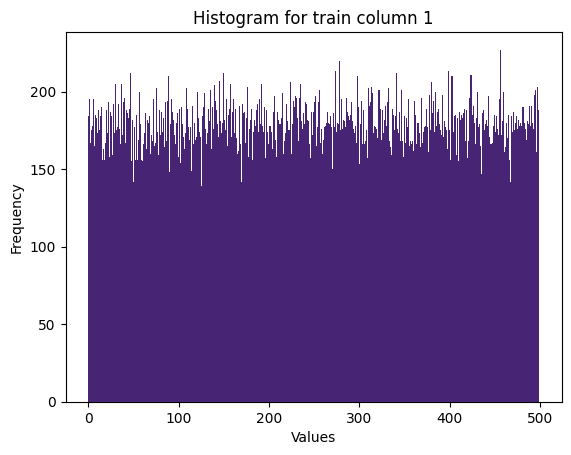

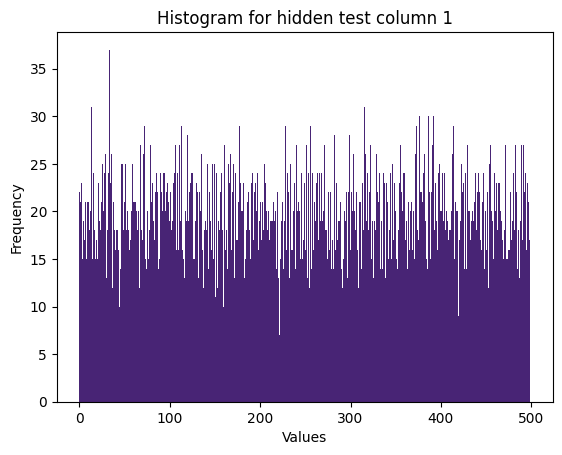

Moving on to another column named 2; Current loop index: 2
2 is of type integer


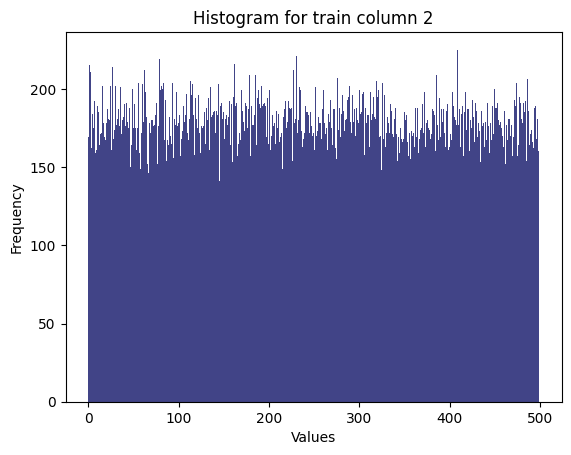

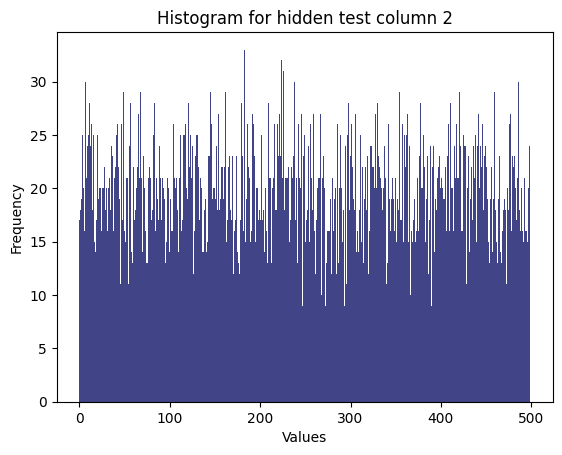

Moving on to another column named 3; Current loop index: 3
3 is of type integer


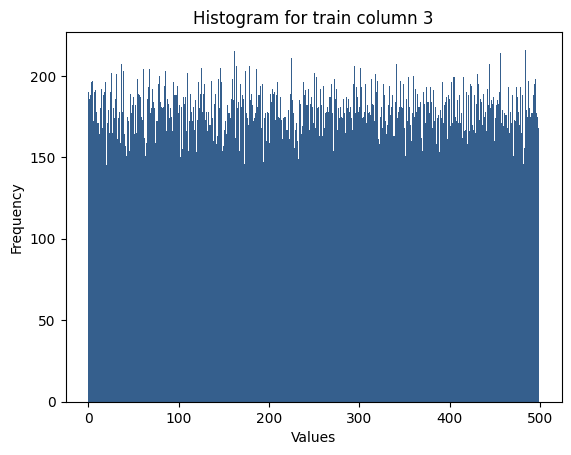

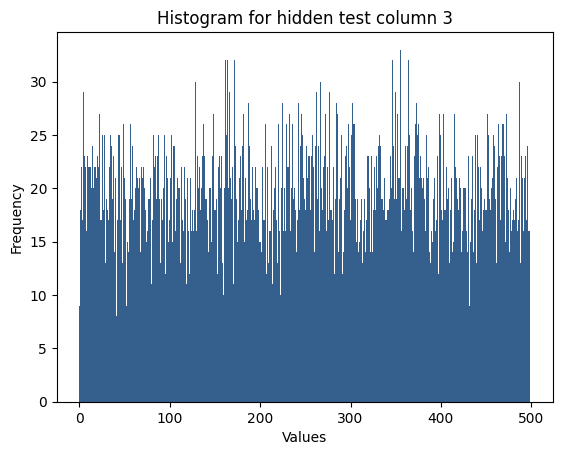

Moving on to another column named 4; Current loop index: 4
4 is of type integer


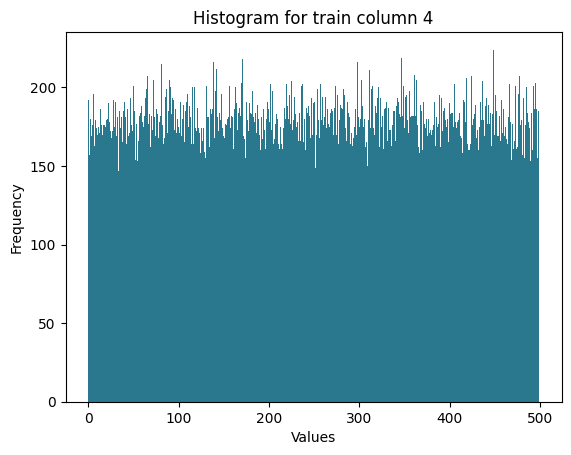

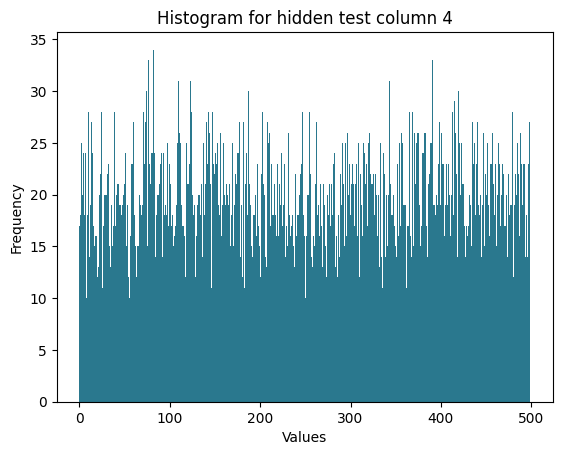

Moving on to another column named 5; Current loop index: 5
5 is of type integer


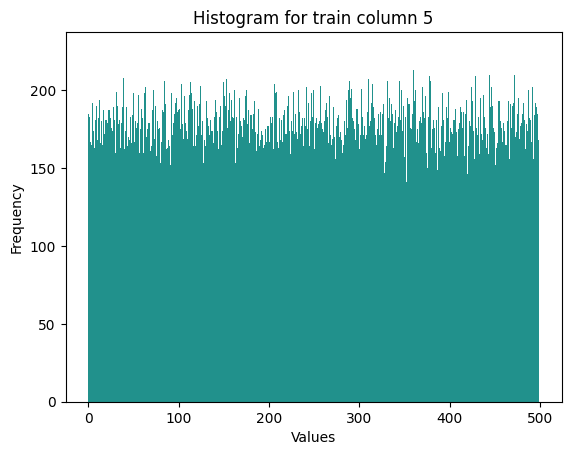

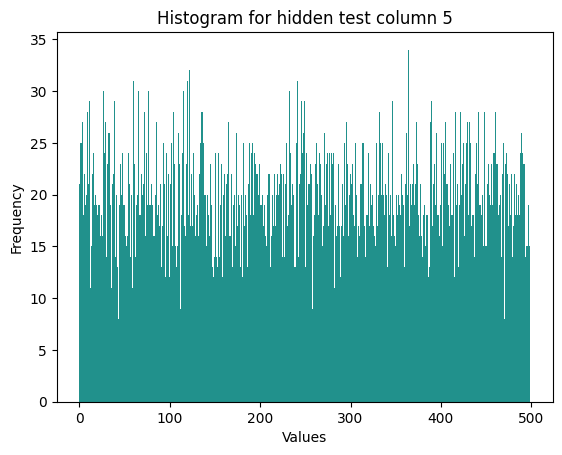

Moving on to another column named 6; Current loop index: 6
Moving on to another column named 7; Current loop index: 7
Moving on to another column named 8; Current loop index: 8
8 is of type integer


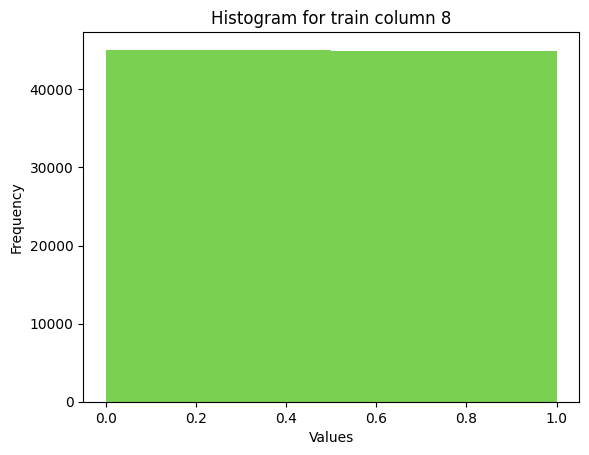

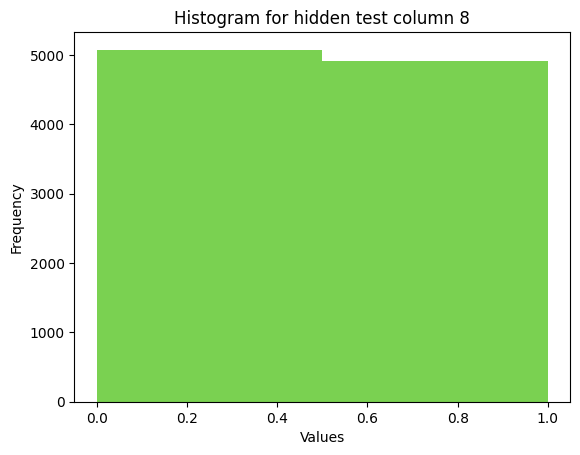

Moving on to another column named 9; Current loop index: 9
9 is of type integer


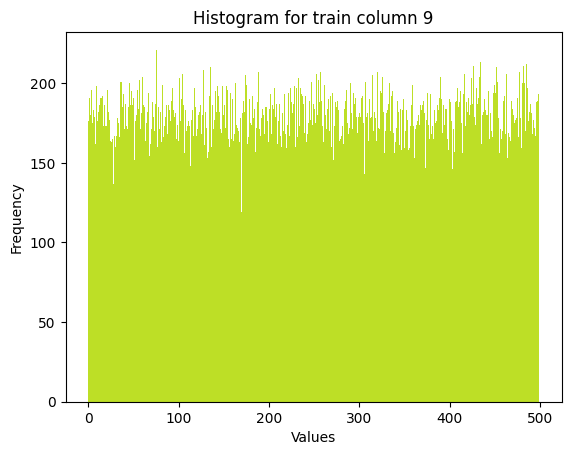

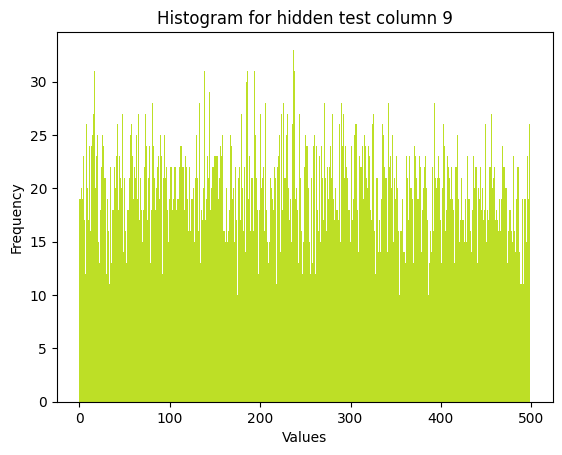

Moving on to another column named 10; Current loop index: 10
10 is of type integer


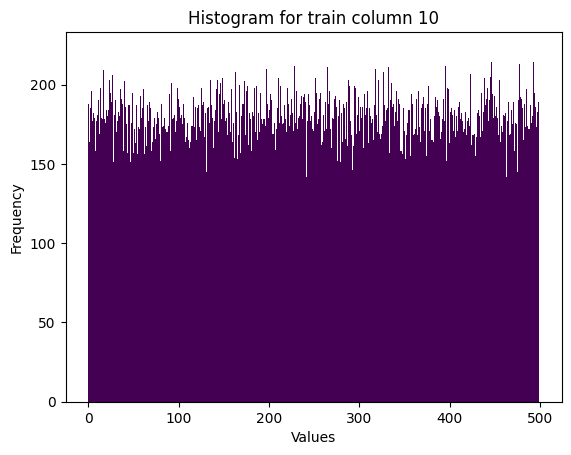

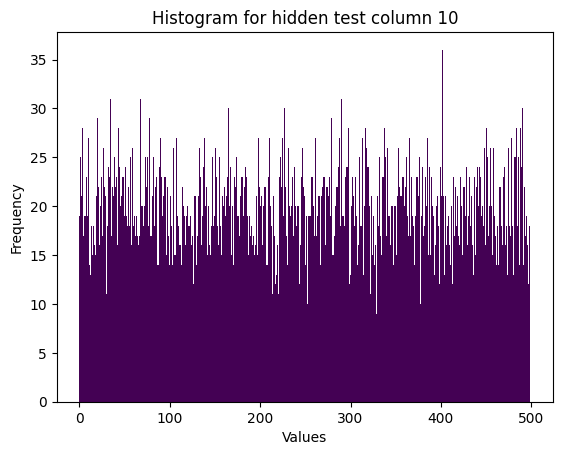

Moving on to another column named 11; Current loop index: 11
11 is of type integer


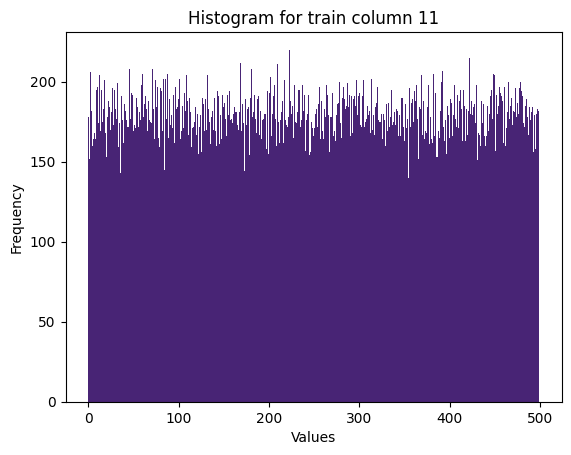

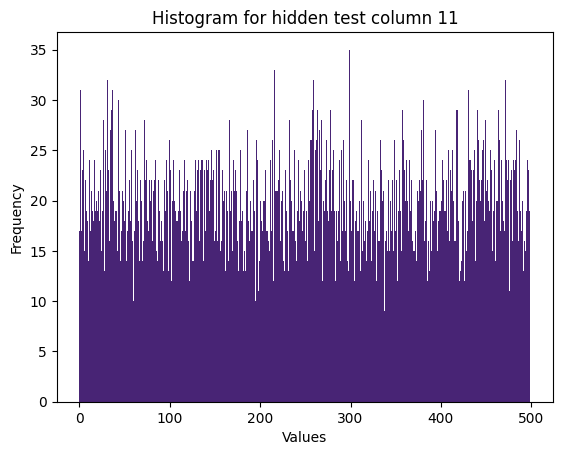

Moving on to another column named 12; Current loop index: 12
12 is of type integer


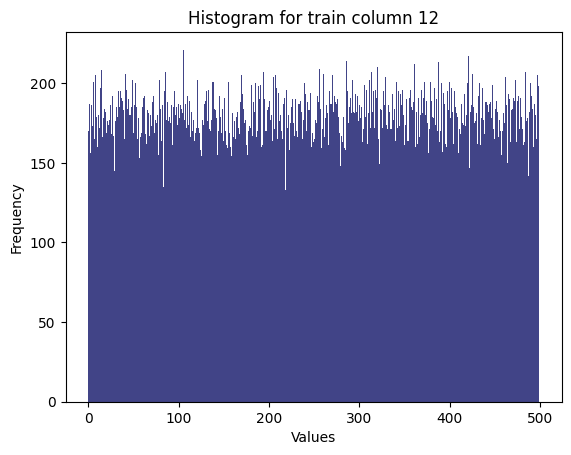

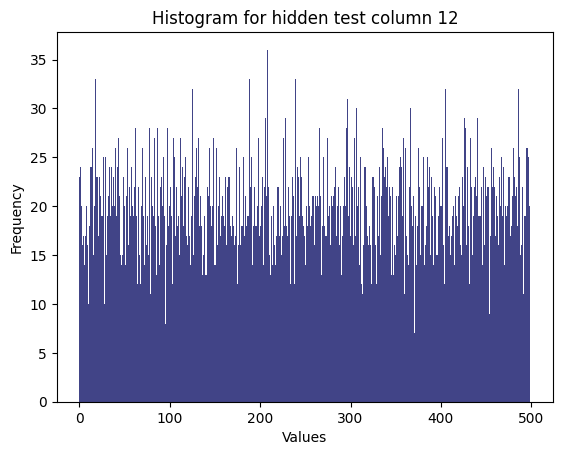

Moving on to another column named 13; Current loop index: 13
Moving on to another column named 14; Current loop index: 14
Moving on to another column named 15; Current loop index: 15
Moving on to another column named 16; Current loop index: 16
Moving on to another column named 17; Current loop index: 17
Moving on to another column named 18; Current loop index: 18
Moving on to another column named 19; Current loop index: 19
Moving on to another column named 20; Current loop index: 20
Moving on to another column named 21; Current loop index: 21
Moving on to another column named 22; Current loop index: 22
Moving on to another column named 23; Current loop index: 23
Moving on to another column named 24; Current loop index: 24
Moving on to another column named 25; Current loop index: 25
Moving on to another column named 26; Current loop index: 26
Moving on to another column named 27; Current loop index: 27
Moving on to another column named 28; Current loop index: 28
Moving on to another col

In [19]:
for i, column in enumerate(COMMON_COLUMNS):
    print(f"Moving on to another column named {column}; Current loop index: {i}")
    if pd.api.types.is_integer_dtype(train_df[column]):
        print(f"{column} is of type integer")
        plot_histogram(train_df[column], MAIN_VIRIDIS_COLORS_LIST[i  % MAIN_VIRIDIS_COLORS_LEN], title=f"Histogram for train column {column}") 
        plot_histogram(hidden_test_df[column], MAIN_VIRIDIS_COLORS_LIST[i % MAIN_VIRIDIS_COLORS_LEN], title=f"Histogram for hidden test column {column}")

<Axes: >

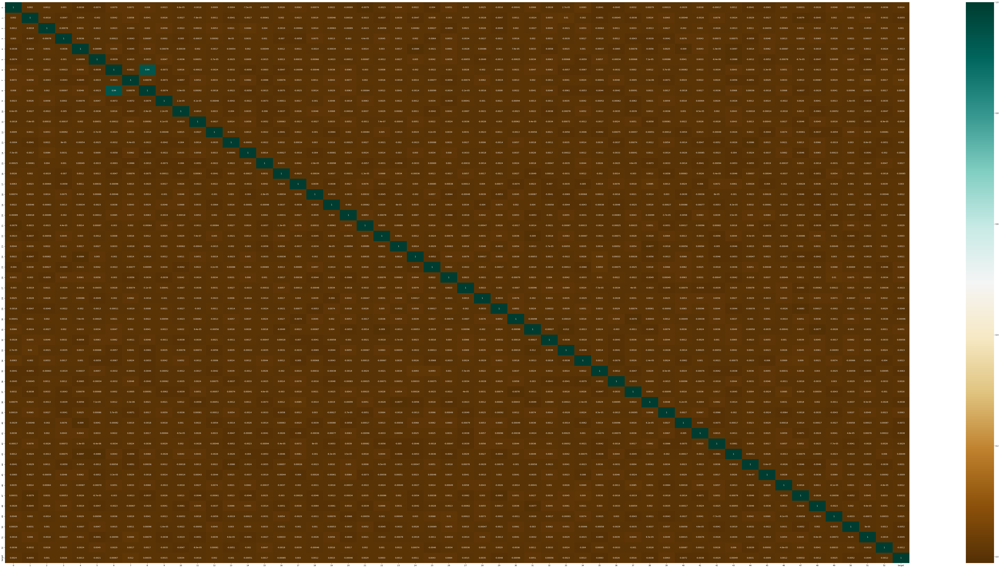

In [20]:
plt.figure(figsize=(100,50))
train_df_corr = train_df.corr()
sns.heatmap(train_df_corr,cmap="BrBG",annot=True)

<Axes: >

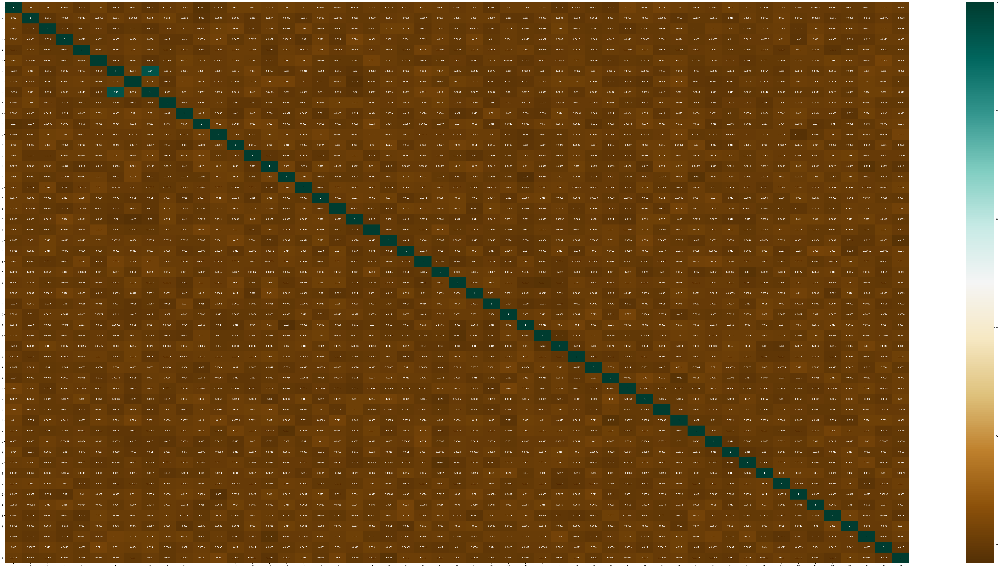

In [21]:
plt.figure(figsize=(100,50))
hidden_test_df_corr = hidden_test_df.corr()
sns.heatmap(hidden_test_df_corr,cmap="BrBG",annot=True)

In [22]:
hidden_test_df['6']

0       3.316625
1      -8.888194
2       2.645751
3      -6.164414
4       8.000000
          ...   
9995    6.708204
9996    5.656854
9997    4.690416
9998    4.000000
9999    9.539392
Name: 6, Length: 10000, dtype: float64

**Column `6` might be created with the use of `8` at the same time all other columns have low correlationship which might be related to the anonimization technique used.**

In [23]:
def test_statistical_significance(correlation_callback=stats.pearsonr, significance_level=0.05):
    correlation_coefficient, p_value = correlation_callback(hidden_test_df['6'], hidden_test_df['8'])
    
    print(f"Correlation coefficient (r): {correlation_coefficient}")
    print(f"P-value: {p_value}")
    
    if p_value < significance_level:
        print("The correlation is statistically significant.")
    else:
        print("The correlation is not statistically significant.")

In [24]:
for sgn_lvl in [0.01, 0.05, 0.1]:
    test_statistical_significance(
                                  correlation_callback=stats.pearsonr, 
                                  significance_level=sgn_lvl
                                 )

Correlation coefficient (r): 0.940357961045535
P-value: 0.0
The correlation is statistically significant.
Correlation coefficient (r): 0.940357961045535
P-value: 0.0
The correlation is statistically significant.
Correlation coefficient (r): 0.940357961045535
P-value: 0.0
The correlation is statistically significant.


In [25]:
for sgn_lvl in [0.01, 0.05, 0.1]:
    test_statistical_significance(
                                  correlation_callback=stats.spearmanr, 
                                  significance_level=sgn_lvl
                                 )

Correlation coefficient (r): 0.8658449130069902
P-value: 0.0
The correlation is statistically significant.
Correlation coefficient (r): 0.8658449130069902
P-value: 0.0
The correlation is statistically significant.
Correlation coefficient (r): 0.8658449130069902
P-value: 0.0
The correlation is statistically significant.


## EDA specialized libraries

Found out that there are some libraries that can speed up the process and give reports in few lines.

### EDA with sweetviz

Later on found out about sweetviz and decided to give it a go.

In [27]:
!pip install sweetviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 65.6 MB/s eta 0:00:00:00:0100:01


In [28]:
 import sweetviz as sv

General report by features

                                             |          | [  0%]   00:00 -> (? left)


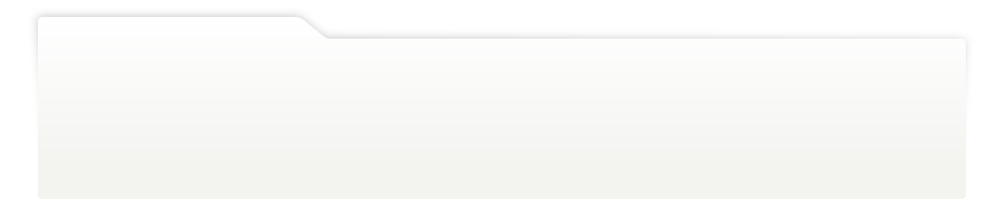
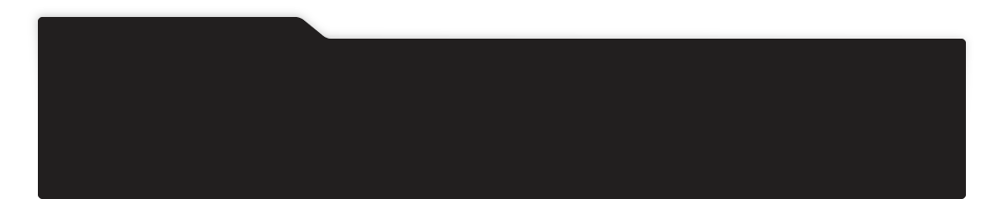
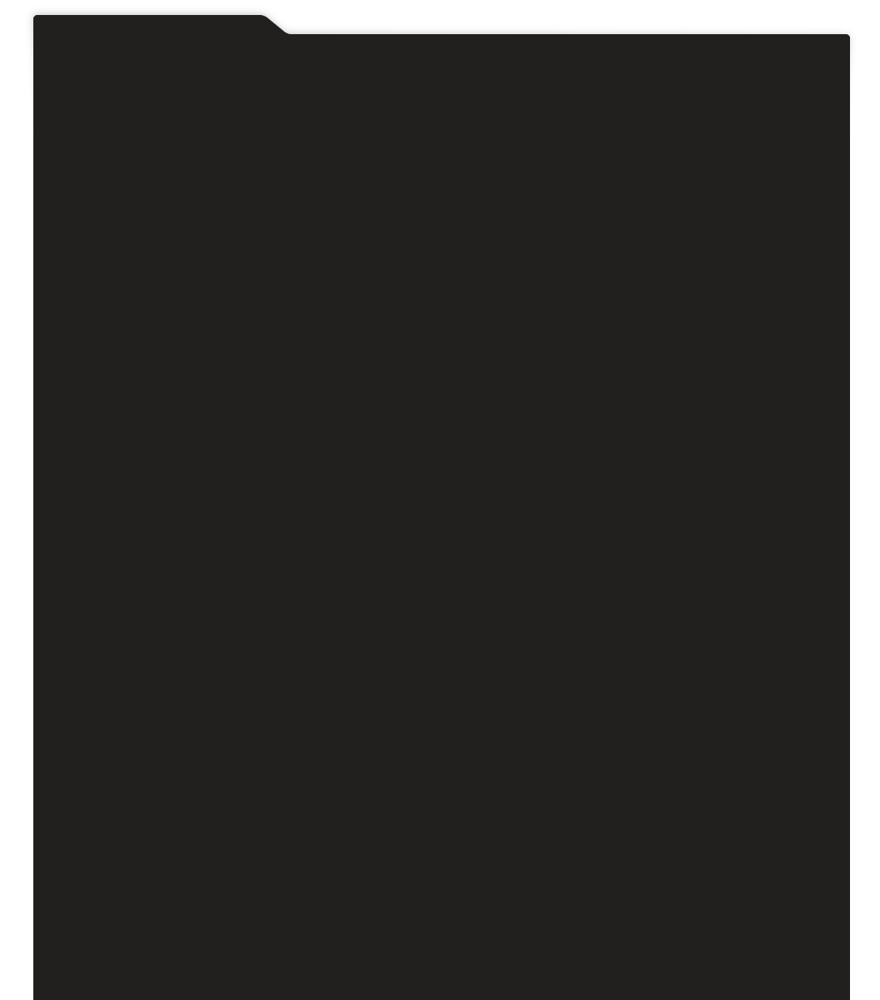
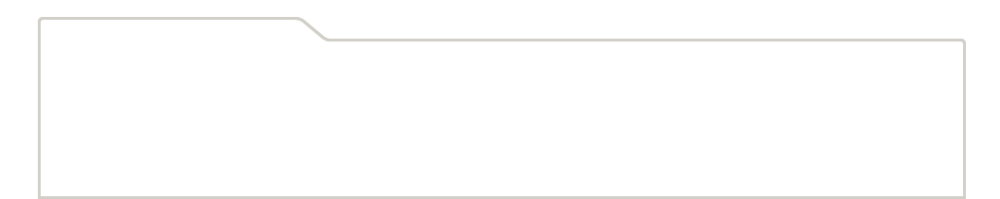
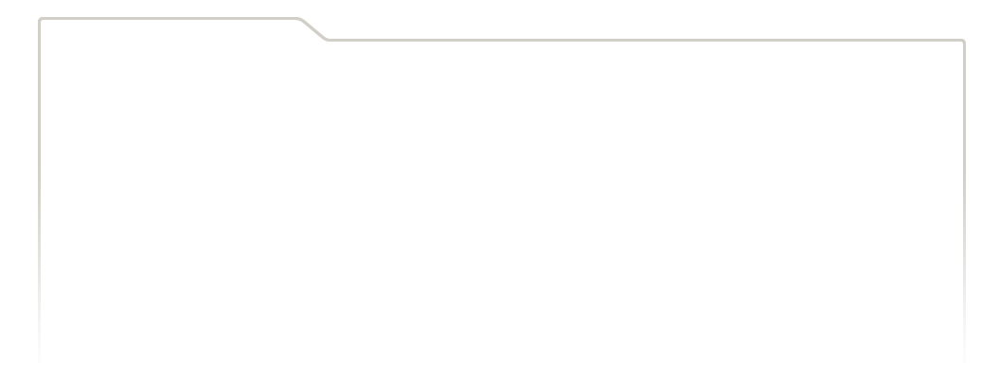
...
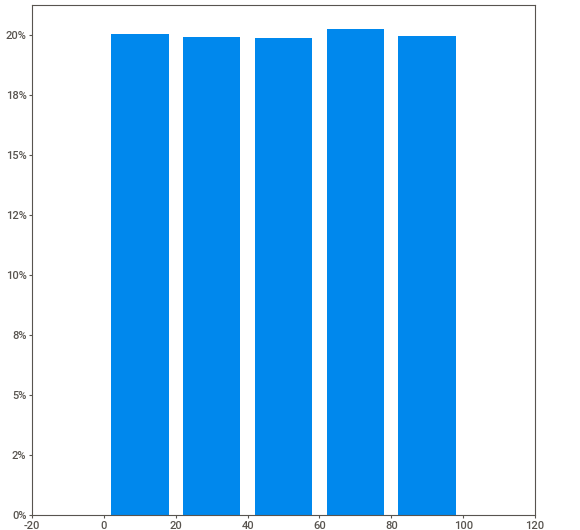
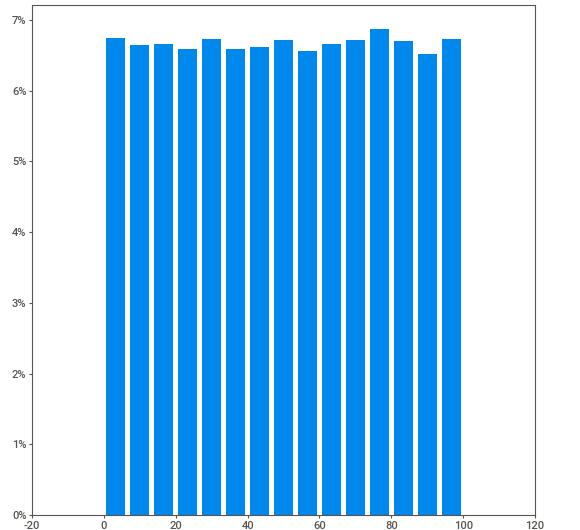
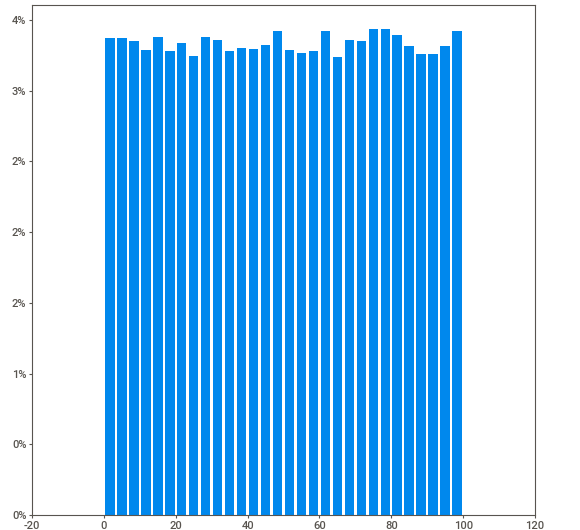
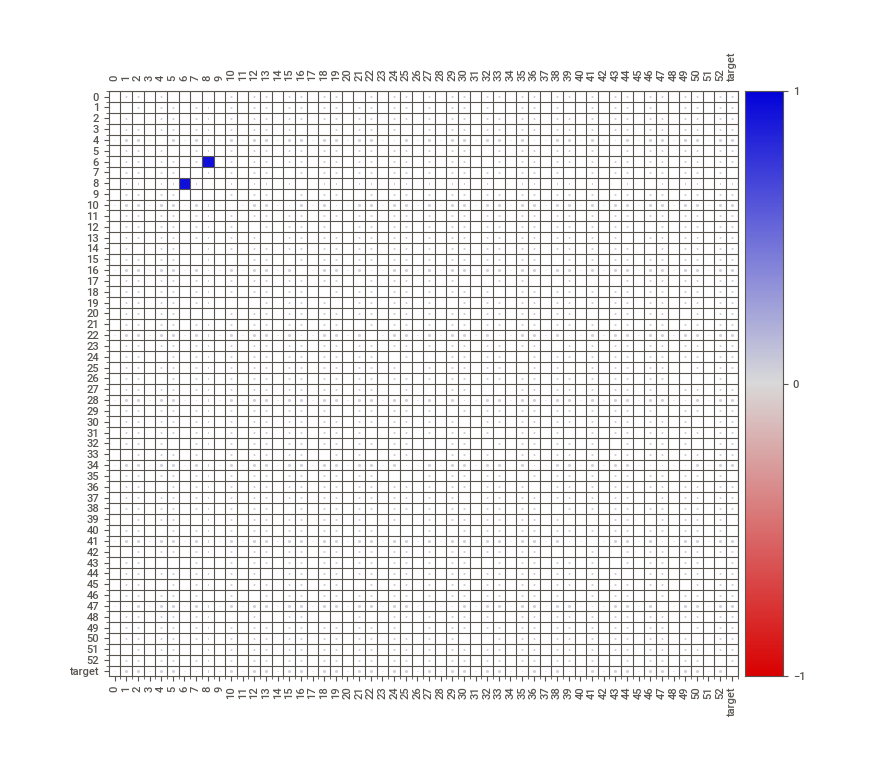
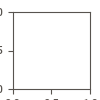

In [29]:
my_report = sv.analyze(train_df)
my_report.show_notebook(w="100%", h="full") # if working in Kaggle

### Target feature report

In [30]:
target_feature_report = sv.analyze([train_df, "Train"], target_feat=TARGET_COLUMN)

                                             |          | [  0%]   00:00 -> (? left)


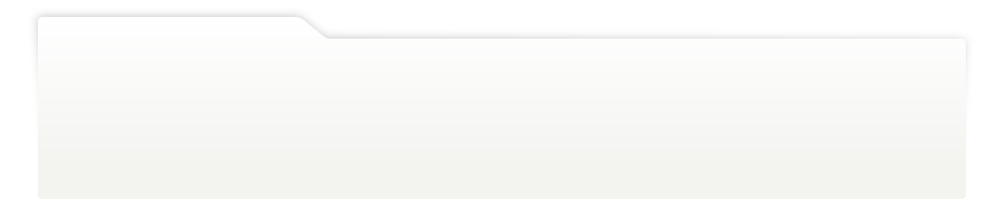
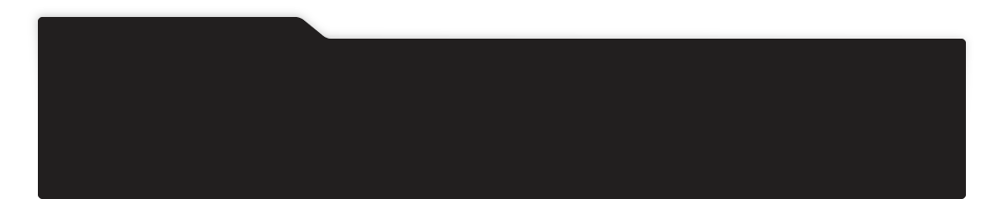
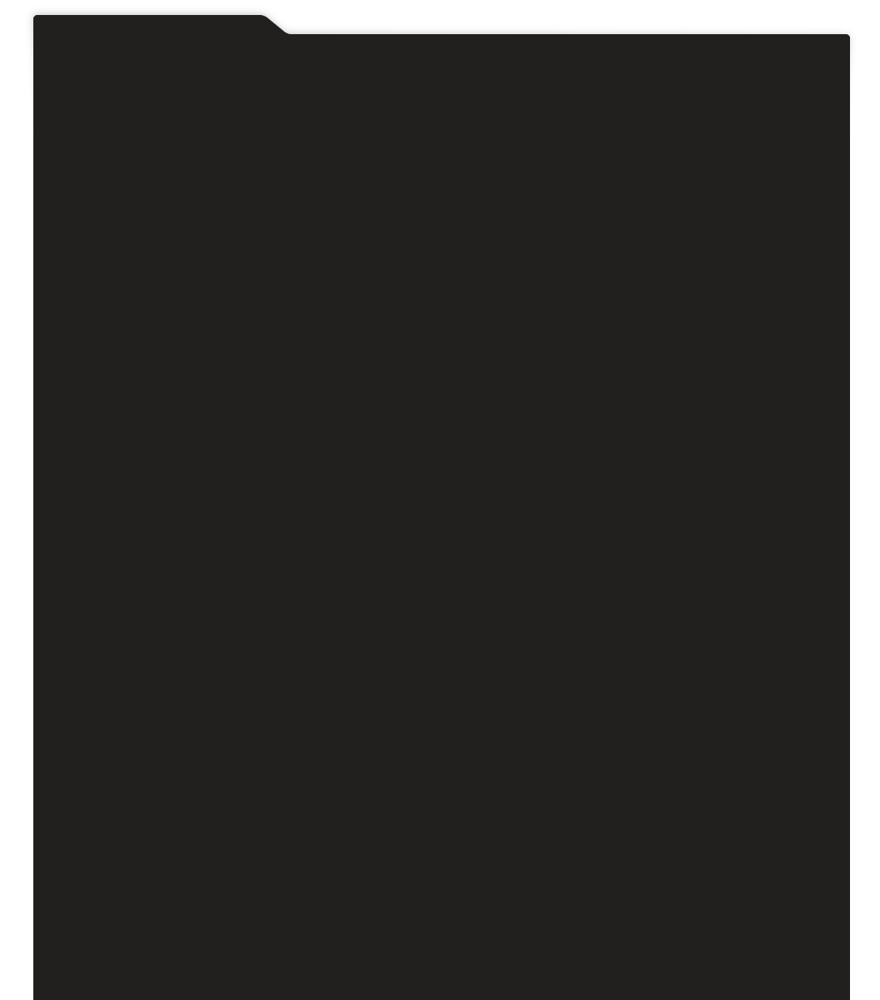
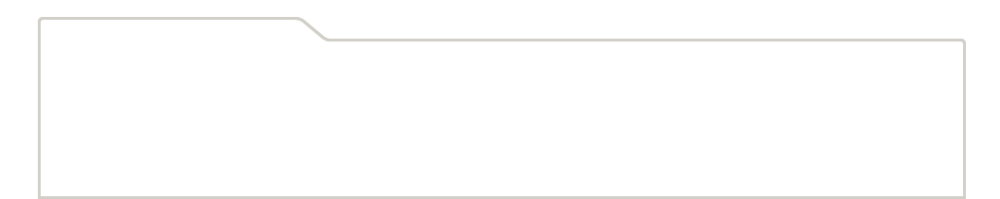
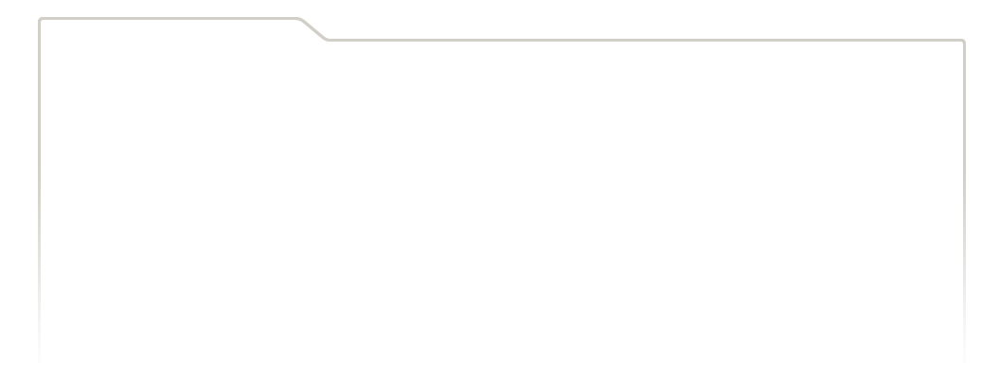
...
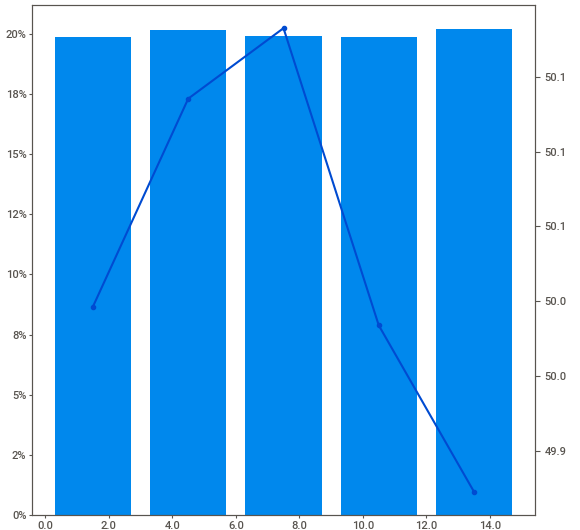
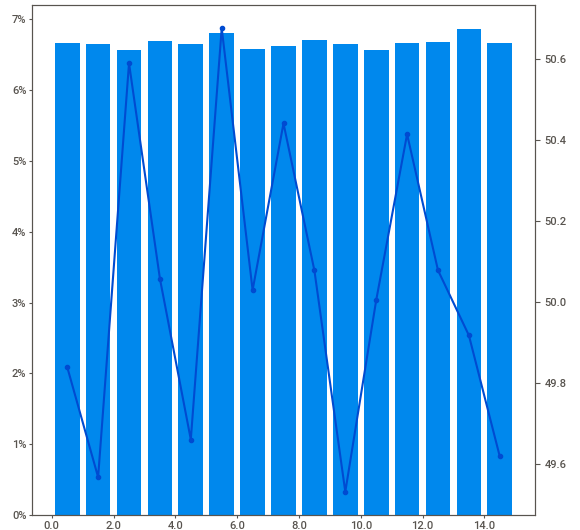
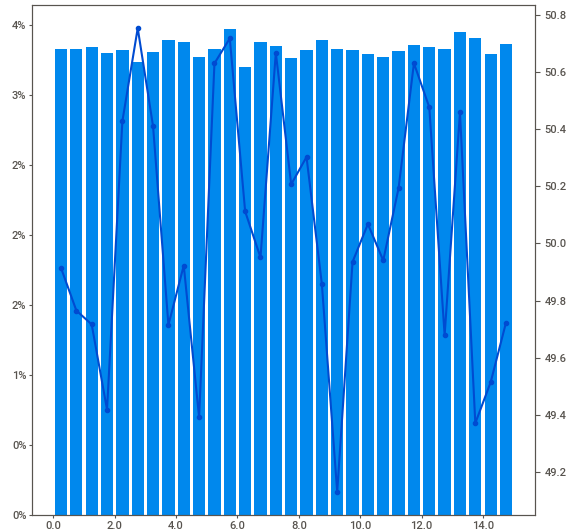
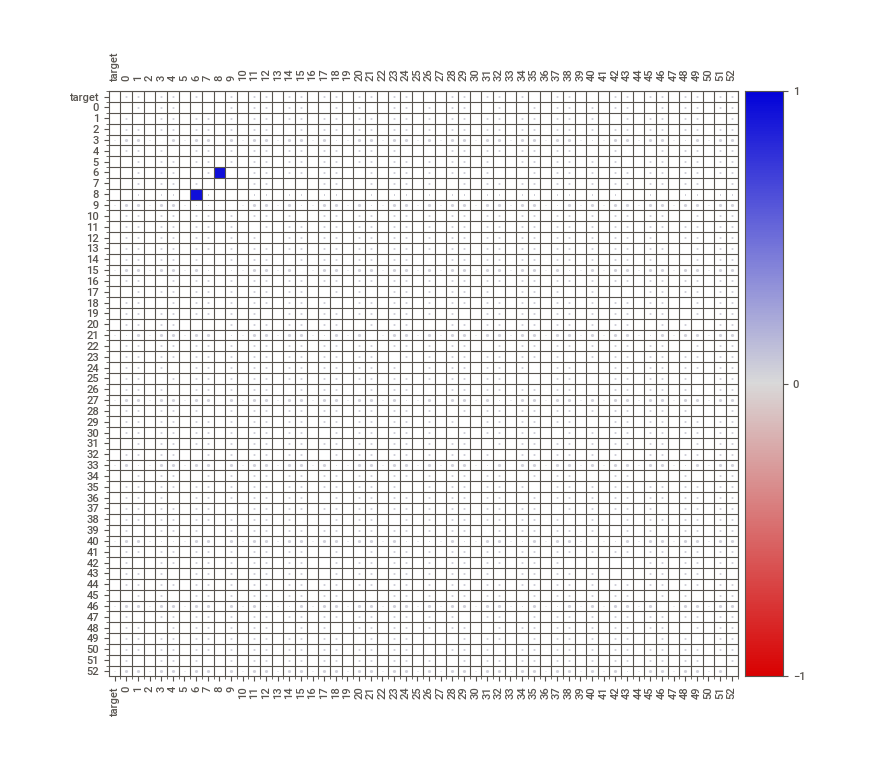
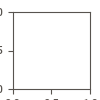

In [31]:
 target_feature_report.show_notebook(w="100%", h="full")

### EDA with Autoviz

Also decided to try alternative called Autoviz

In [32]:
!pip install autoviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.5/67.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.2/161.2 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.9/255.9 MB 6.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 53.4 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: nltk
    Found existing installation: nltk 3.2.4
    Uninstalling nltk-3.2.4:
      Successfully uninstalled nltk-3.2.4
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.0.3
    Uninstalling xgboost-2.0.3:
      Successfully uninstalled xgboost-2.0.3
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.12.2
    Uninstalling seaborn-0.12.2:
      Successfully 

In [33]:
from autoviz import AutoViz_Class

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [34]:
AV = AutoViz_Class()

dft = AV.AutoViz(
    "",
    sep=",",
    depVar=TARGET_COLUMN,
    dfte=train_df,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=90000,
    max_cols_analyzed=52,
    save_plot_dir=None
)

Shape of your Data Set loaded: (90000, 54)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing up to 30 columns (max) in each category:
    Numeric Columns : ['6', '7', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']
    Integer-Categorical Columns: ['0', '1', '2', '3', '4', '5', '9', '10', '11', '12']
    String-Categorical Columns: []
    Factor-Categorical Columns: []
    String-Boolean Columns: []
    Numeric-Boolean Columns: ['8']
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: []
    Columns that will not be considered in modeling: []
    53 Predictors clas

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
6,float64,0.000000,NA,-9.949874,9.949874,No issue
20,float64,0.000000,NA,0.000382,14.999953,No issue
49,float64,0.000000,NA,0.000014,14.999928,No issue
46,float64,0.000000,NA,0.000154,14.999733,No issue
52,float64,0.000000,NA,0.000125,14.999775,No issue
44,float64,0.000000,NA,0.000019,14.999900,No issue
10,int64,0.000000,0,0.000000,499.000000,No issue
5,int64,0.000000,0,0.000000,499.000000,No issue
12,int64,0.000000,0,0.000000,499.000000,No issue
target,float64,0.000000,100,0.002634,99.999482,Target column


Number of All Scatter Plots = 21
All Plots are saved in ./AutoViz_Plots/target
Time to run AutoViz = 110 seconds 


I would not rely fully on importance of these features as they get them through XGBoost(perhaps through feature importance) 

## Conclusion

Overall we have data without missing values and no duplicate rows. As for data types: most of the features are `float64`, but are easily convertable to `float32` or *even further* as their maximum value is small and usually is less than 20(to be more precise 15). At the same time we may assume that `integer` values are categorical and number of categories is close to 500 in every `integer` column except number `6` which is binary.

Mean values do not fluctuate much and min and max values are preserved, meaning some sort of normalization could be applied. 

As for correlationship between features, we did not find highly correlated features except for `6` and `8`(Pearson and Spearman correlations where higher than 0.8 and statistically they may be / are significant) which in our case is slightly strange as data has been anonimized and because of this most of the columns might not correlate(for example: anonimization through PCA), however more information on correlation processes needs to be obtained. Another suggestion is that one of the features might generated based on the other after anonimization process.

Most columns are equally distributed except for `6`:

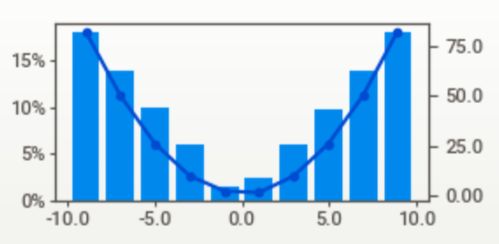

Also it is worth mentioning that some of float values appear frequently in this column, despite valus being `float64`.

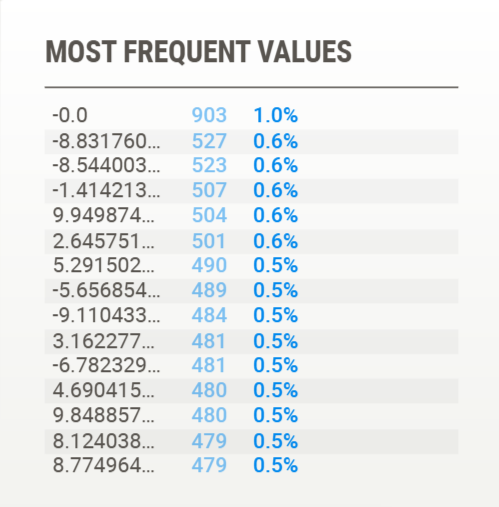

Interestingly, this feature did go into top features of AutoViz:

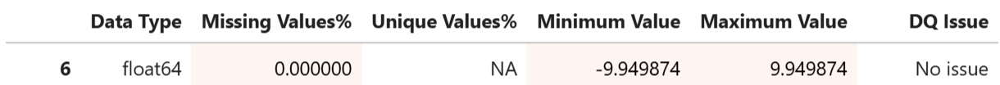